In [2]:
import pandas as pd
import numpy as np

In [3]:
df=pd.read_csv("D:/Excel/Dataset .csv")
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [4]:
df.shape

(9551, 21)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

**Task: Top Cuisines**


Determine the top three most common cuisines in the dataset.

In [6]:
top_Cuisines=df['Cuisines'].str.split(",").explode().value_counts().head(3)
print(top_Cuisines)

Cuisines
North Indian    2992
 Chinese        1880
 Fast Food      1314
Name: count, dtype: int64


Calculate the percentage of restaurants that serve each of the top cuisines.

In [7]:
total_restaurant=len(df)
total_restaurant
Cuisines_percentage1=(top_Cuisines/total_restaurant)*100
Cuisines_percentage1

Cuisines
North Indian    31.326563
 Chinese        19.683803
 Fast Food      13.757722
Name: count, dtype: float64

**Task: City Analysis**

Identify the city with the highest number of restaurants in the dataset.


In [8]:
df['City'].value_counts().head(1)

City
New Delhi    5473
Name: count, dtype: int64

Calculate the average rating for restaurants in each city.

In [9]:
average_rating_restaurants=df.groupby('City')['Aggregate rating'].mean()
average_rating_restaurants.head()

City
Abu Dhabi    4.300000
Agra         3.965000
Ahmedabad    4.161905
Albany       3.555000
Allahabad    3.395000
Name: Aggregate rating, dtype: float64

Determine the city with the highest average rating.

In [10]:
Max_rating_city=average_rating_restaurants.idxmax()
print(f'city with the highest average rating :{Max_rating_city}')

city with the highest average rating :Inner City


**Task: Price Range Distribution**

Create a histogram or bar chart to visualize the distribution of price ranges among the restaurants.

In [11]:
count=df['Price range'].value_counts()
count


Price range
1    4444
2    3113
3    1408
4     586
Name: count, dtype: int64

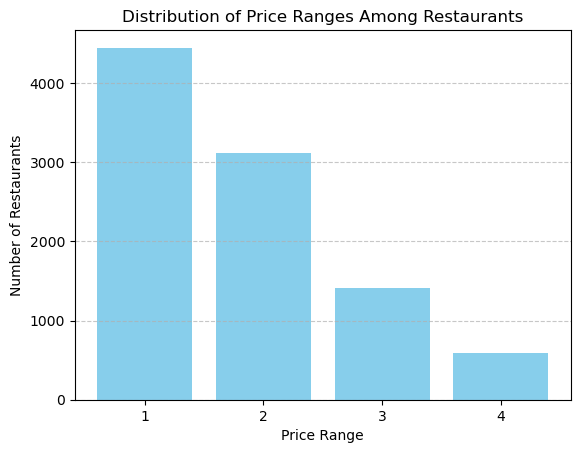

In [12]:
import matplotlib.pyplot as plt
plt.bar(count.index,count.values,color='skyblue')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.title('Distribution of Price Ranges Among Restaurants')
plt.xticks([1, 2, 3, 4])  
plt.grid(axis='y', linestyle='--', alpha=0.7)

Calculate the percentage of restaurants in each price range category

In [13]:
percentage_restaurants={f'price_range {i}':(count[i]/total_restaurant)*100 for i in range(1,5)}
for price_range,percentage in percentage_restaurants.items():
    print(f"{price_range}:{percentage:.2f}%")

price_range 1:46.53%
price_range 2:32.59%
price_range 3:14.74%
price_range 4:6.14%


**Task: Online Delivery**


Determine the percentage of restaurants that offer online delivery.

In [14]:
Online_delivery=df['Has Online delivery'].value_counts()
Online_delivery

Has Online delivery
No     7100
Yes    2451
Name: count, dtype: int64

In [15]:
print(f"Percentage of restaurants that offer online delivery {(Online_delivery['Yes']/total_restaurant)*100:.2f}%")

Percentage of restaurants that offer online delivery 25.66%


Compare the average ratings of restaurants with and without online delivery.

In [16]:
Avg_rating=df.groupby('Has Online delivery')['Aggregate rating'].mean()
Avg_rating

Has Online delivery
No     2.465296
Yes    3.248837
Name: Aggregate rating, dtype: float64

**Conclusion**:Average ratings of restaurants with online delivery is more than without online delivery.

**Task:2 Restaurant Ratings**


Analyze the distribution of aggregate ratings and determine the most common rating range.

In [17]:
count_ratings=df['Aggregate rating'].value_counts().idxmax()
print(f'most common rating range is {count_ratings}')

most common rating range is 0.0


Calculate the average number of votes received by restaurants

In [18]:
Average_votes=df['Votes'].mean()
print(f'Average number of votes received by restaurant is {Average_votes}')

Average number of votes received by restaurant is 156.909747670401


**Task: Cuisine Combination**


Identify the most common combinations of cuisines in the dataset.

In [19]:
Cuisine_combination=df['Cuisines'].value_counts()
Cuisine_combination=Cuisine_combination[Cuisine_combination.index.str.contains(',')]
print(f'The most common combinations of cuisines are {Cuisine_combination.head(1)}.')


The most common combinations of cuisines are Cuisines
North Indian, Chinese    511
Name: count, dtype: int64.


Determine if certain cuisine combinations tend to have higher ratings

In [20]:
higher_ratings=df.groupby('Cuisines')['Aggregate rating'].max().sort_values(ascending=False)
higher_ratings.head(1)


Cuisines
Brazilian, Bar Food    4.9
Name: Aggregate rating, dtype: float64

**Conclusion**:North Indian, Chinese are the most common combinations of cuisines.But it is not the highest rated one.

**Task: Geographic Analysis**


Plot the locations of restaurants on a map using longitude and latitude coordinates.

In [21]:
import folium
import pandas as pd

# Create a Folium map centered around the first restaurant
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Add markers for each restaurant
for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name'],
        icon=folium.Icon(color="red", icon="cutlery", prefix="fa")
    ).add_to(restaurant_map)

# Display the map
restaurant_map
